# Comparison impedance of split.xmen  

In [1]:
versioninfo()

Julia Version 1.0.1
Commit 0d713926f8 (2018-09-29 19:05 UTC)
Platform Info:
  OS: Linux (x86_64-pc-linux-gnu)
  CPU: AMD E2-3000M APU with Radeon(tm) HD Graphics
  WORD_SIZE: 64
  LIBM: libopenlibm
  LLVM: libLLVM-6.0.0 (ORCJIT, generic)


In [2]:
using DataFrames
using Plots
using StatPlots
using CSV

pyplot()

┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/DataFrames/AR9oZ.ji for DataFrames [a93c6f00-e57d-5684-b7b6-d8193f3e46c0]
└ @ Base loading.jl:1187
┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/Plots/ld3vC.ji for Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80]
└ @ Base loading.jl:1187


┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/GR/NDU5Y.ji for GR [28b8d3ca-fb5f-59d9-8090-bfdbd6d07a71]
└ @ Base loading.jl:1187
┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1189
┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/Distributions/xILW0.ji for Distributions [31c24e10-a181-5473-b8eb-7969acd0382f]
└ @ Base loading.jl:1187
┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/IterableTables/727hO.ji for IterableTables [1c8ee90f-4401-5389-894e-7a04a3dc0f4d]
└ @ Base loading.jl:1187
┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/Widgets/F5dj0.ji for Widgets [cc8bc4a8-27d6-5769-a93b-9d913e69aa62]
└ @ Base loading.jl:1187
┌ Info: Recompiling stale cache file /home/yoshinobu/.julia/compiled/v1.0/Clustering/Ovl2Q.ji for Clustering [aaaa29a8-35af-508c-8bc3-b662a17a0fe5]
└ @ Base loading.jl:1187
┌ Info: Recompiling stale cache file /home/yoshi

Plots.PyPlotBackend()

Read C version split.imp

In [3]:
cdat = CSV.read("../sample/split.imp");

In [4]:
head(cdat)

,freq,imp.real,imp.imag,mag
1,0.0,0.0,0.0,0.0
2,2.5,0.508638,3.60799,11.2308
3,5.0,0.755699,6.87759,16.8008
4,7.5,0.947425,10.0877,20.114
5,10.0,1.11006,13.2679,22.4864
6,12.5,1.25405,16.43,24.338


In [5]:
rename!(cdat, Symbol("imp.real")=>:rel, Symbol("imp.imag")=>:img);

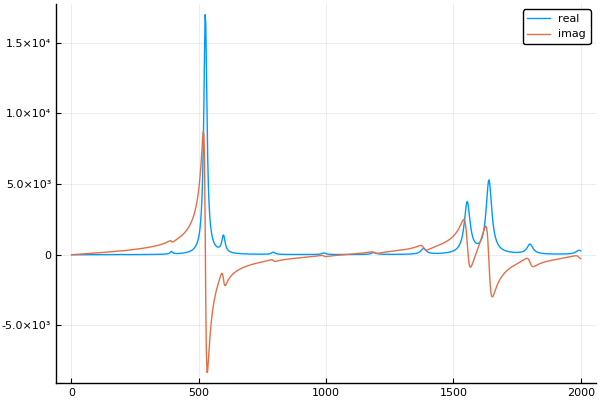

In [6]:
@df cdat plot(:freq, [:rel, :img], label = ["real" "imag"])

In [7]:
jdat = CSV.read("split_julia.imp");

In [8]:
head(jdat)

,freq,real,imag,mag
1,0.0,0.0,0.0,-Inf
2,2.5,0.508638,3.60794,11.2307
3,5.0,0.755699,6.87754,16.8008
4,7.5,0.947425,10.0877,20.114
5,10.0,1.11006,13.2679,22.4864
6,12.5,1.25405,16.43,24.338


It seems data by Julia and C are exactly same.

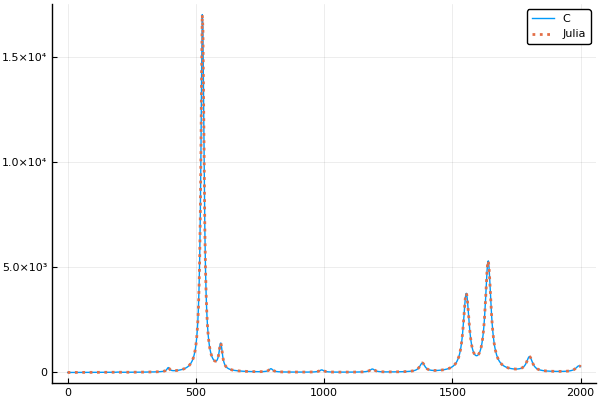

In [10]:
plot(cdat[:freq], [cdat[:rel], jdat[:real]], label = ["C" "Julia"], line = [:solid :dot], w = [1 2])

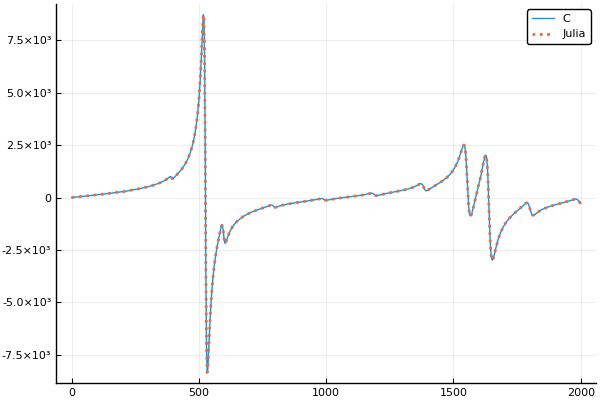

In [11]:
plot(cdat[:freq], [cdat[:img], jdat[:imag]], label = ["C" "Julia"], line = [:solid :dot], w = [1 2])

OK